# Medical Cost Prediction Using 40+ Models 

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [6]:
img = Image.open("/content/drive/MyDrive/Data/mufid-majnun-PzSgaHsQmgY-unsplash.jpg")
img.show()

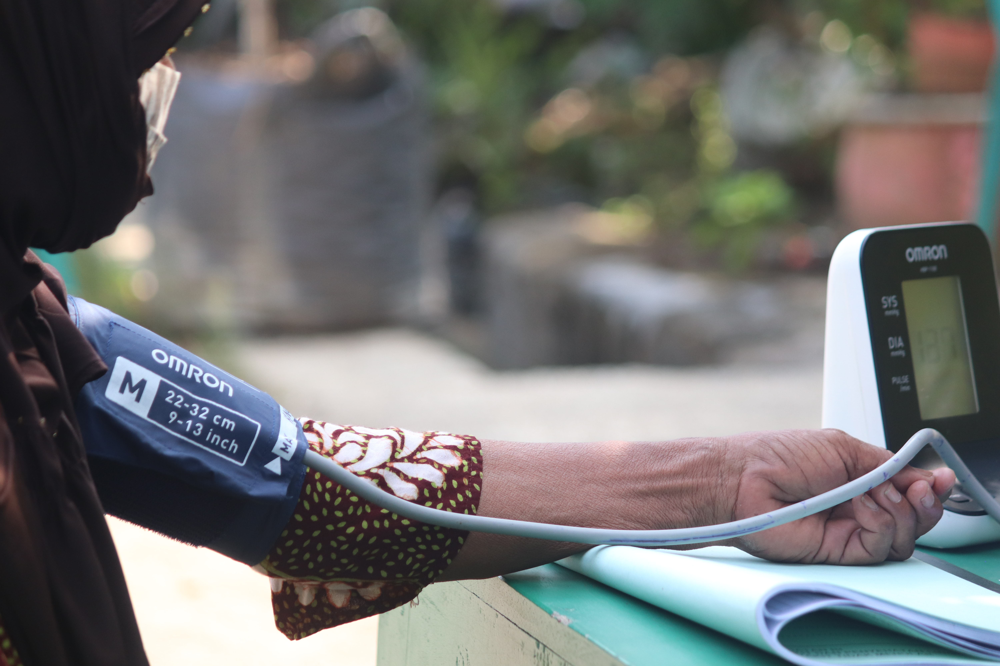

In [7]:
img

### Background

This project i was trying to using `lazypredict` module to help me training model. That module could help the user to train multiple model at the same time. I think this module would help me to guide me which model that best suited with a problem / dataset. Then i can focus only on subset of them to improve model performance further.

### Problem Statement 
1. From all trained model, which model will perform better ? 
2. What this project will tell us ?  


### Objectives 
1. Training multiple models using `lazypredict` module
2. Summarizing what this project tells us 

### Data Exploration 

In [8]:
import pandas as pd 
import numpy as np 
from numpy import percentile
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from IPython.display import clear_output, display
from PIL import Image

%matplotlib inline
warnings.filterwarnings('ignore')

In [9]:
df = pd.read_csv(r'/content/drive/MyDrive/Data/Medical Cost Prediction .csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1338 entries, 0 to 1337
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       1338 non-null   int64  
 1   sex       1338 non-null   object 
 2   bmi       1338 non-null   float64
 3   children  1338 non-null   int64  
 4   smoker    1338 non-null   object 
 5   region    1338 non-null   object 
 6   charges   1338 non-null   float64
dtypes: float64(2), int64(2), object(3)
memory usage: 73.3+ KB


first, lets check how our numerical data distributed

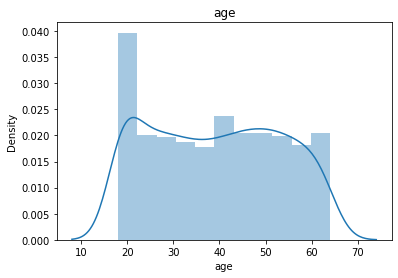

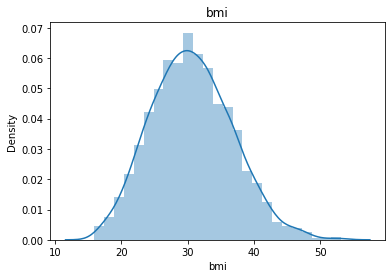

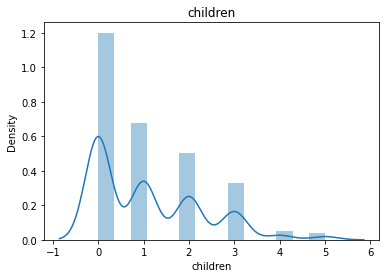

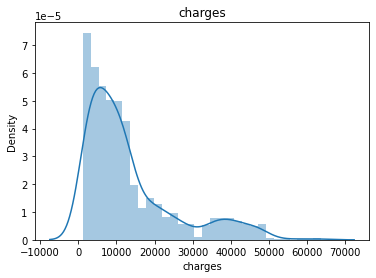

In [10]:
for i in df.columns : 
  if ( (df[i].dtypes == 'int64') | (df[i].dtypes == 'float64') ):
    sns.distplot(df[i])
    plt.title(i)
    plt.show()

In [11]:
df.describe()

,age,bmi,children,charges
count,1338.000000,1338.000000,1338.000000,1338.000000
mean,39.207025,30.663397,1.094918,13270.422265
std,14.049960,6.098187,1.205493,12110.011237
min,18.000000,15.960000,0.000000,1121.873900
25%,27.000000,26.296250,0.000000,4740.287150
50%,39.000000,30.400000,1.000000,9382.033000
75%,51.000000,34.693750,2.000000,16639.912515
max,64.000000,53.130000,5.000000,63770.428010


After checking our numerical data, we can conclude that : 
1. We have bmi feature that seen has a gaussian distribution
2. Probably there is significant high number of outliers in our target (charges) variables
3. We will tackle this issue later using IQR method  


Now we seen how numerical data distributed. How about we should we check cardinality for our object features ? 

In [12]:
for i in df.columns:
  if df[i].dtypes == 'object':
    print(i)
    print(df[i].nunique())

sex
2
smoker
2
region
4


How about missing values ? is this datasets has any ? 

In [13]:
df.isnull().sum().sum()

0

After we perform some checking on our data we can conclude that : 
1. Our data has several features that a non gaussian distribution
2. Our object features relatively has low cardinality. Which is a good thing.
3. Our data was clean from any missing values 

### Data Cleaning
Now we have only have one issues (outliers) that we will tackle in this project. Since this data was already clean enough, we will not doing much in data cleaning process

#### Detecting Outliers

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1338 entries, 0 to 1337
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       1338 non-null   int64  
 1   sex       1338 non-null   object 
 2   bmi       1338 non-null   float64
 3   children  1338 non-null   int64  
 4   smoker    1338 non-null   object 
 5   region    1338 non-null   object 
 6   charges   1338 non-null   float64
dtypes: float64(2), int64(2), object(3)
memory usage: 73.3+ KB


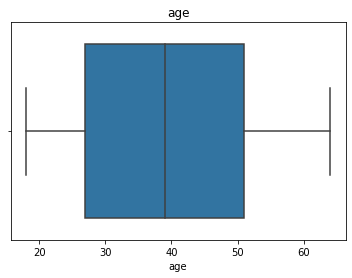

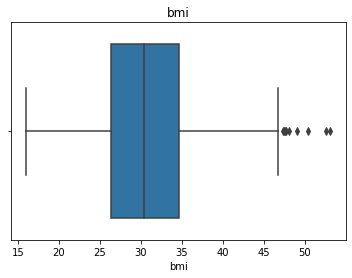

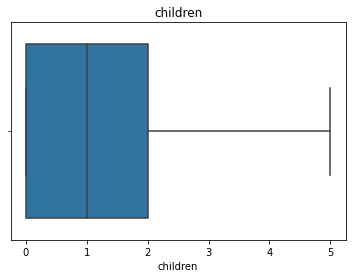

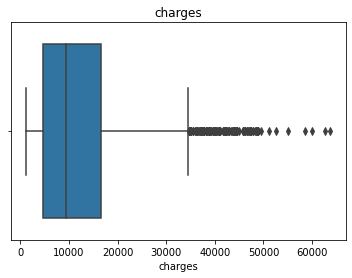

In [15]:
for i in df.columns : 
  if (df[i].dtypes != 'object'):
    plt.title(i)
    sns.boxplot(df[i])
    plt.show()

As we suspected from histogram we created before, charges variables has significant number of outliers. We will using IQR method to identify what number exactly the outliers in charges variables

#### Removing Outliers Using IQR Methods 

In [16]:
# calculate interquartile range
q25 = percentile(df['charges'], 25) 
q75 = percentile(df['charges'], 75)
iqr = q75 - q25

cutoff = 1.5 * iqr
lower = q25 - cutoff
upper = q75 + cutoff
print(f'The Lower Limit is : {lower}, The Upper Limit is : {upper}')

The Lower Limit is : -13109.1508975, The Upper Limit is : 34489.350562499996


- The lower limits have negative values ? maybe this phenomenon caused by the high variability of 'charge' features. Since in nature the tendency in 'charge' feature is that each person will get different medical cost.
- Since Our focus for this project was about feature encoding, we will stick removing outliers using IQR method and tackle this issue in the future.


In [17]:
print('The Number of Above Upper Limits :' ,len(df[df['charges'] > upper]))
print('The Number of Below Lower Limits :' ,len(df[df['charges'] < lower]))

The Number of Above Upper Limits : 139
The Number of Below Lower Limits : 0


- From 1338 rows of data, we have 139 number of outliers in 'charges' features. Is like 10% + of our 'charges' features were outliers. 
- Because we don't want losing any more information. We will replace the outliers with median values 

In [18]:
median = np.median(df['charges'])

In [19]:
df['charges'] = np.where(df['charges'] > upper, median, df['charges'])

Now we get rid of outliers, now we can get to move to data preprocessing

### Data Preprocessing
- For object features, i will using one hot encoding and label encoding. Label encoding for binary object & ordinal data types. The rest will using one hot encoding
- For integer / numerical features, i will using normalization 
- Before doing any of that, let's split the data

In [20]:
X = df.drop('charges', axis=1)
y = df['charges']

In [21]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

#### Feature Encoding on Object Features


In [22]:
ordinalbiner = ['sex', 'smoker']

In [23]:
for i in X_train[ordinalbiner].columns:
  label = LabelEncoder()
  X_train[i] = label.fit_transform(X_train[i])

for i in X_test[ordinalbiner].columns:
  label = LabelEncoder()
  X_test[i] = label.fit_transform(X_test[i])

In [24]:
X_train = pd.get_dummies(X_train)
X_test = pd.get_dummies(X_test)

#### Feature Encoding on Numerical Features

In [25]:
stdscal = StandardScaler()
X_train = stdscal.fit_transform(X_train)
X_test = stdscal.fit_transform(X_test)

Now we have preprocessed the data, let's move to model training !

### Model Training
- In this project i'm trying to use lazypredict module for model training. That module will lets python user to train multiple model simultaneously.   
- The modules will gives us 42 different models for regression problem with thier model performance predicting target variable !
- This idea mainly inspired by a notebook created by Sanskar Hasija at Kaggle. [Click here](https://https://www.kaggle.com/code/odins0n/titanic-27-different-models-comparison#Training-27-Different-Classifiers)
- You can also check the official documentation [Click here](https://https://lazypredict.readthedocs.io/en/latest/) 

In [26]:
!pip install lazypredict

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [27]:
from lazypredict.Supervised import LazyRegressor

In [28]:
reg = LazyRegressor(verbose=0,ignore_warnings=False, custom_metric=None, random_state = 42)
models,predictions = reg.fit(X_train, X_test, y_train, y_test)

 90%|█████████ | 38/42 [01:34<00:17,  4.41s/it]

[15:42:58] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


100%|██████████| 42/42 [01:35<00:00,  2.27s/it]


In [29]:
models

,Adjusted R-Squared,R-Squared,RMSE,Time Taken
Model,,,,
LGBMRegressor,0.60,0.61,4422.91,0.13
HistGradientBoostingRegressor,0.59,0.60,4469.19,0.35
XGBRegressor,0.58,0.59,4517.16,0.24
GradientBoostingRegressor,0.58,0.59,4530.99,0.15
RandomForestRegressor,0.56,0.57,4632.96,0.36
BaggingRegressor,0.53,0.55,4770.96,0.05
ExtraTreesRegressor,0.51,0.53,4880.59,0.32
AdaBoostRegressor,0.47,0.48,5091.46,0.04
KNeighborsRegressor,0.44,0.45,5234.91,0.02


What an amazing results ! now we can select which model that suited for predicting our datasets 

### Model Evaluation 
For the sake of simplicity, we will only Adjusted R Square, R Square and Time Taken as a indicator for model evaluation

In [30]:
model_name = models.index.to_list()
score1 = models['Adjusted R-Squared'].values
score2 = models['R-Squared'].values
score3 = models['Time Taken'].values

In [31]:
model_score = pd.DataFrame({'Model' : model_name, 'Adjusted R Squared' : score1, 'R Squared' : score2, 'Time Taken' : score3})

In [32]:
model_score.head()

,Model,Adjusted R Squared,R Squared,Time Taken
0,LGBMRegressor,0.60,0.61,0.13
1,HistGradientBoostingRegressor,0.59,0.60,0.35
2,XGBRegressor,0.58,0.59,0.24
3,GradientBoostingRegressor,0.58,0.59,0.15
4,RandomForestRegressor,0.56,0.57,0.36


#### Visualizing Models Performance
Let's visualize our data to get see more about has the best performance

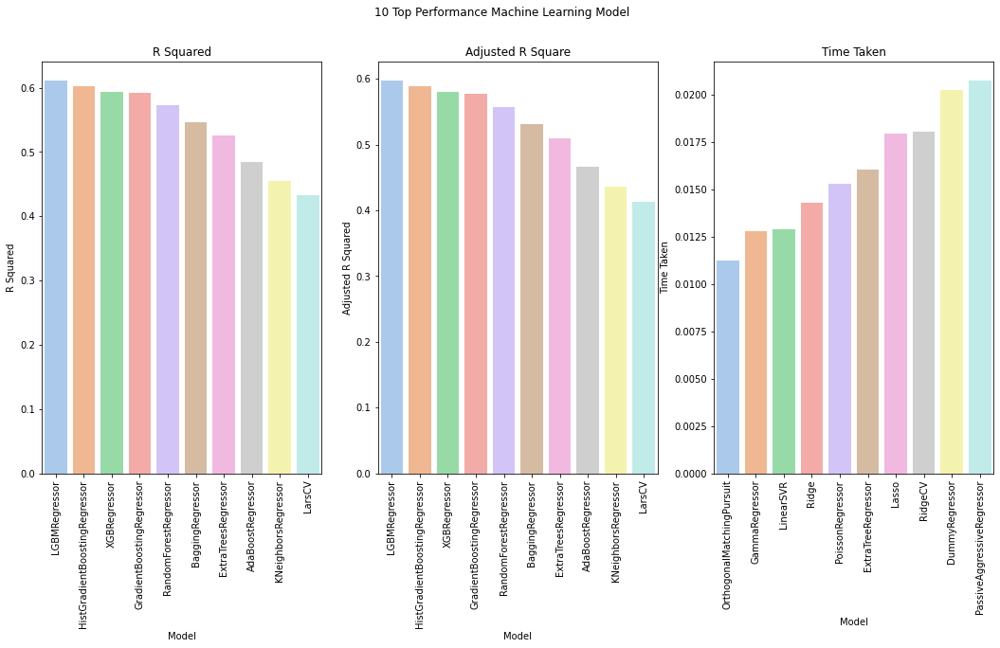

In [33]:
fig, ax = plt.subplots(1, 3, figsize = (18, 8))
plt.suptitle('10 Top Performance Machine Learning Model')

ax[0] = sns.barplot(data = model_score.sort_values(by = 'R Squared', ascending=False)[0:10], x = 'Model', y = 'R Squared', ax = ax[0], palette = 'pastel')
ax[0].set_title('R Squared')
ax[1] = sns.barplot(data = model_score.sort_values(by = 'Adjusted R Squared', ascending=False)[0:10], x = 'Model', y = 'Adjusted R Squared', ax= ax[1], palette = 'pastel')
ax[1].set_title('Adjusted R Square')
ax[2]= sns.barplot(data = model_score.sort_values(by = 'Time Taken', ascending=True)[0:10], x = 'Model', y = 'Time Taken', ax= ax[2], palette = 'pastel')
ax[2].set_title('Time Taken')


for label in ax[0].get_xticklabels():
    label.set_rotation(90)
for label in ax[1].get_xticklabels():
    label.set_rotation(90)
for label in ax[2].get_xticklabels():
    label.set_rotation(90)

plt.show()

### Conclusion from This Project
1. The data has quite in a good condition. Leaving the outliers problem that appears many in our dataset
2. In terms of performance, we get 3 best model performance (R Square & R Adjusted Square), that is :
  1. LGBMRegressor
  2. HistGradientRegressor
  3. XGBRegressor
3. In future work, maybe we will focusing on search best parameters of these 3 to get better results !